# Contrast Stretching  

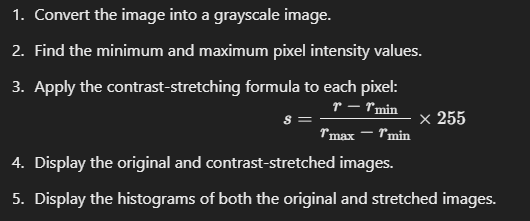

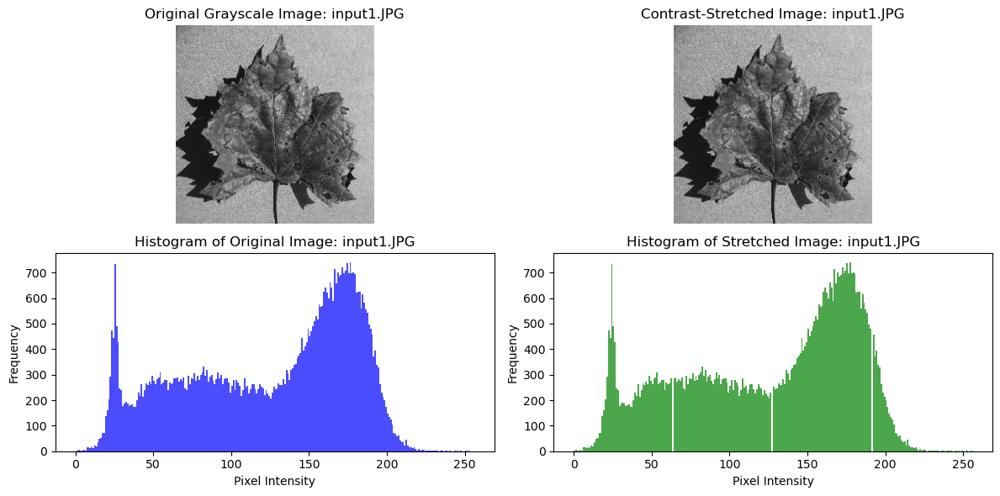

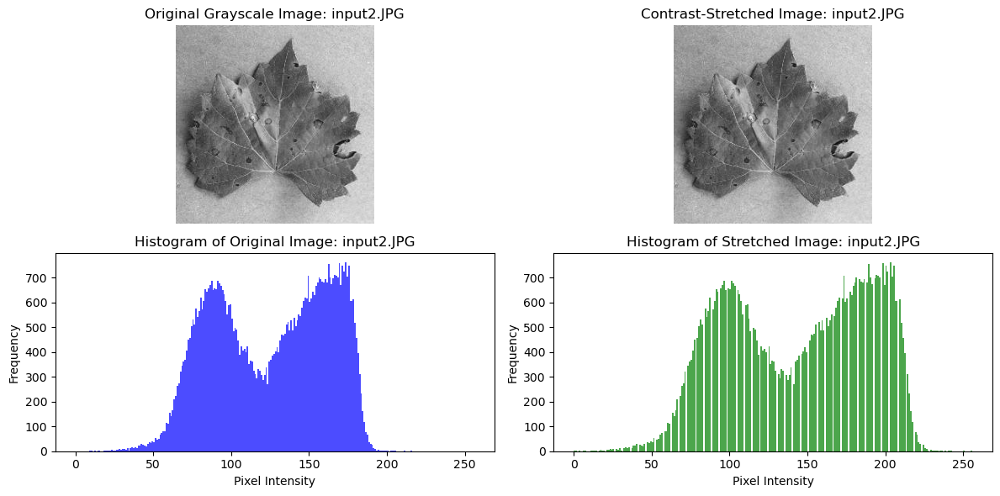

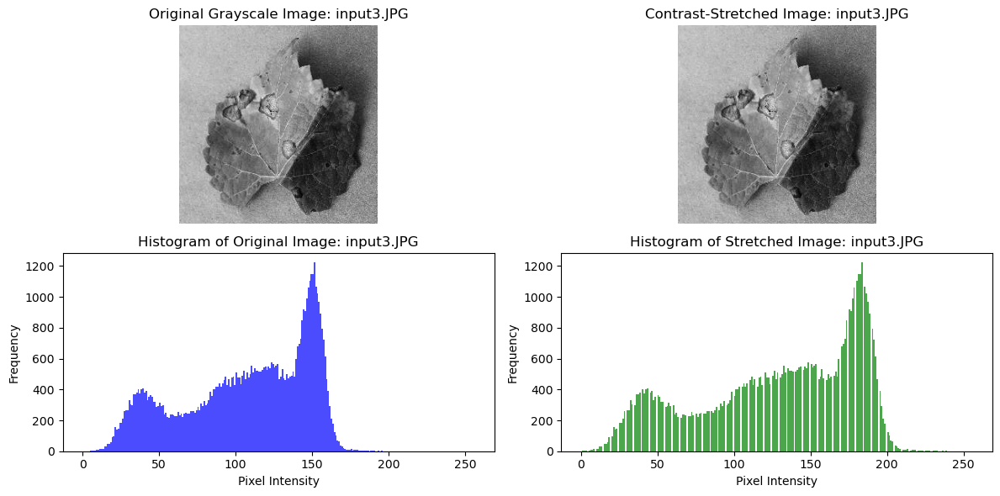

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


folder_path = "analysis_data"  


image_files = [f for f in os.listdir(folder_path) if f.endswith(('.png', '.JPG', '.jpeg'))]


for image_file in image_files:
    
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path)

    # Step 1: Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Step 2: Find minimum and maximum intensity values
    r_min = np.min(gray_image)
    r_max = np.max(gray_image)

    # Step 3: Apply contrast stretching
    stretched_image = ((gray_image - r_min) / (r_max - r_min) * 255).astype(np.uint8)

    # Step 4: Display the images and histograms
    plt.figure(figsize=(12, 6))

    # Original grayscale image
    plt.subplot(2, 2, 1)
    plt.imshow(gray_image, cmap='gray')
    plt.title(f"Original Grayscale Image: {image_file}")
    plt.axis('off')

    # Contrast-stretched image
    plt.subplot(2, 2, 2)
    plt.imshow(stretched_image, cmap='gray')
    plt.title(f"Contrast-Stretched Image: {image_file}")
    plt.axis('off')

    # Histogram of the original grayscale image
    plt.subplot(2, 2, 3)
    plt.hist(gray_image.ravel(), bins=256, range=(0, 256), color='blue', alpha=0.7)
    plt.title(f"Histogram of Original Image: {image_file}")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    # Histogram of the contrast-stretched image
    plt.subplot(2, 2, 4)
    plt.hist(stretched_image.ravel(), bins=256, range=(0, 256), color='green', alpha=0.7)
    plt.title(f"Histogram of Stretched Image: {image_file}")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()


### Histogram Equalization

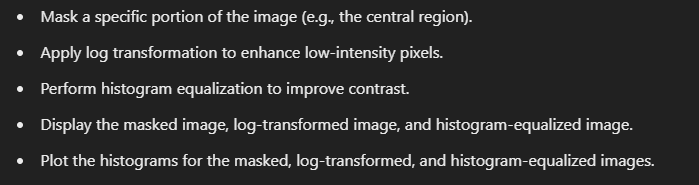

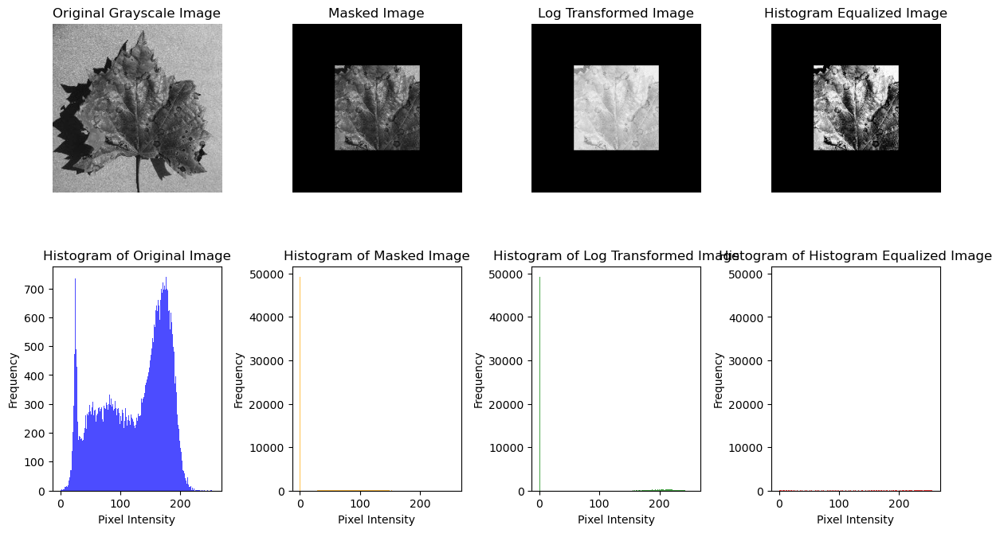

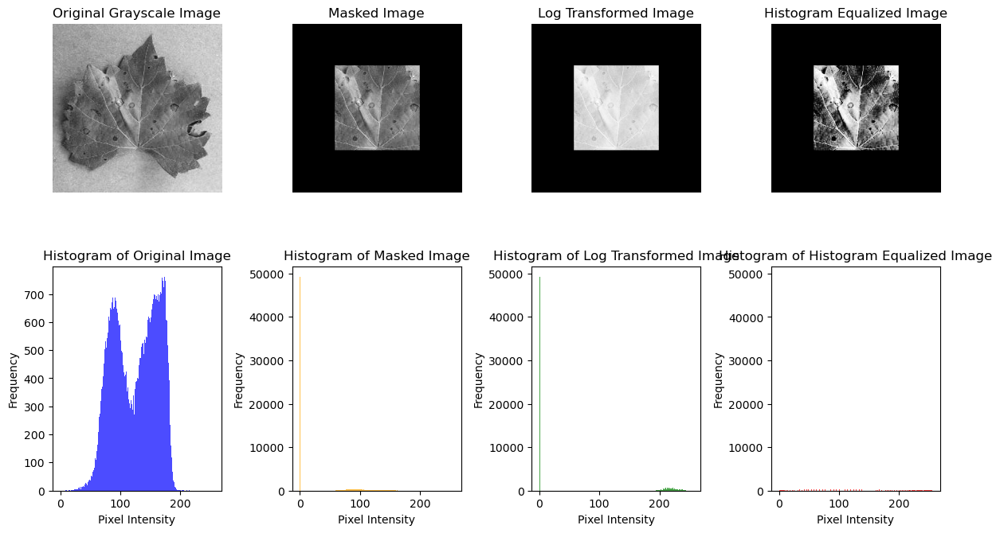

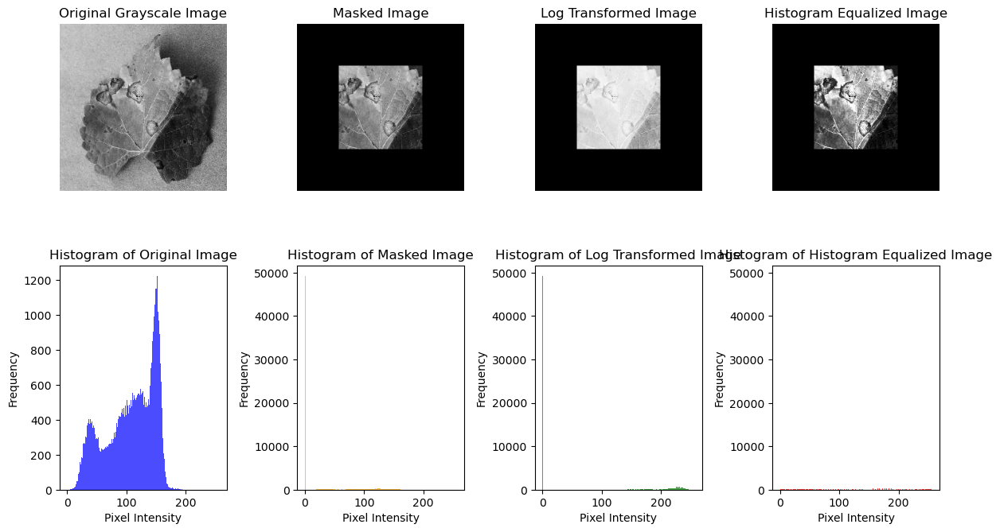

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


folder_path = "analysis_data" 


image_files = [f for f in os.listdir(folder_path) if f.endswith(('.png', '.JPG', '.jpeg'))]

# Function for log transformation
def log_transform(image):
    c = 255 / np.log(1 + np.max(image))
    log_image = c * np.log(1 + image)
    return np.array(log_image, dtype=np.uint8)

# Process each image in the folder
for image_file in image_files:
    # Load the image
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path)

    # Step 1: Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Step 2: Mask some portion of the image
    mask = np.zeros_like(gray_image)
    h, w = gray_image.shape
    mask[h//4:3*h//4, w//4:3*w//4] = 1  # Mask center region
    masked_image = gray_image * mask

    # Step 3: Perform log transformation on the masked image
    log_image = log_transform(masked_image)

    # Step 4: Perform histogram equalization on the masked image
    hist_eq_image = cv2.equalizeHist(masked_image)

    # Step 5: Display images and histograms
    plt.figure(figsize=(12, 10))

    # Original grayscale image
    plt.subplot(3, 4, 1)
    plt.imshow(gray_image, cmap='gray')
    plt.title("Original Grayscale Image")
    plt.axis('off')

    # Masked image
    plt.subplot(3, 4, 2)
    plt.imshow(masked_image, cmap='gray')
    plt.title("Masked Image")
    plt.axis('off')

    # Log transformed image
    plt.subplot(3, 4, 3)
    plt.imshow(log_image, cmap='gray')
    plt.title("Log Transformed Image")
    plt.axis('off')

    # Histogram equalized image
    plt.subplot(3, 4, 4)
    plt.imshow(hist_eq_image, cmap='gray')
    plt.title("Histogram Equalized Image")
    plt.axis('off')

    # Histograms
    plt.subplot(3, 4, 5)
    plt.hist(gray_image.ravel(), bins=256, range=(0, 256), color='blue', alpha=0.7)
    plt.title("Histogram of Original Image")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    plt.subplot(3, 4, 6)
    plt.hist(masked_image.ravel(), bins=256, range=(0, 256), color='orange', alpha=0.7)
    plt.title("Histogram of Masked Image")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    plt.subplot(3, 4, 7)
    plt.hist(log_image.ravel(), bins=256, range=(0, 256), color='green', alpha=0.7)
    plt.title("Histogram of Log Transformed Image")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    plt.subplot(3, 4, 8)
    plt.hist(hist_eq_image.ravel(), bins=256, range=(0, 256), color='red', alpha=0.7)
    plt.title("Histogram of Histogram Equalized Image")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()


# Thresholding

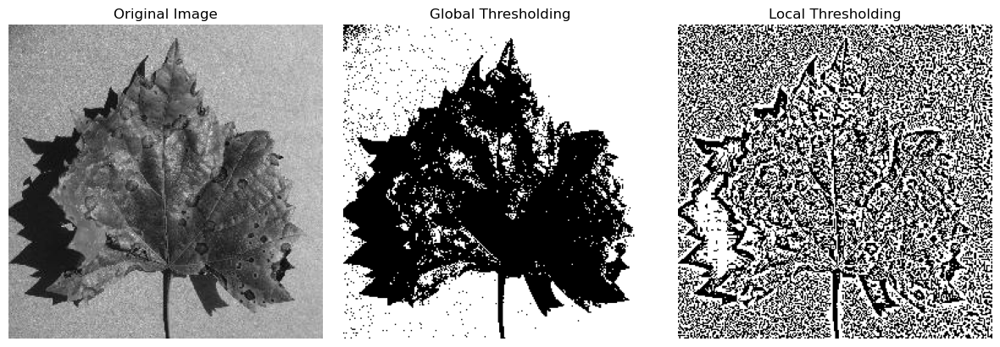

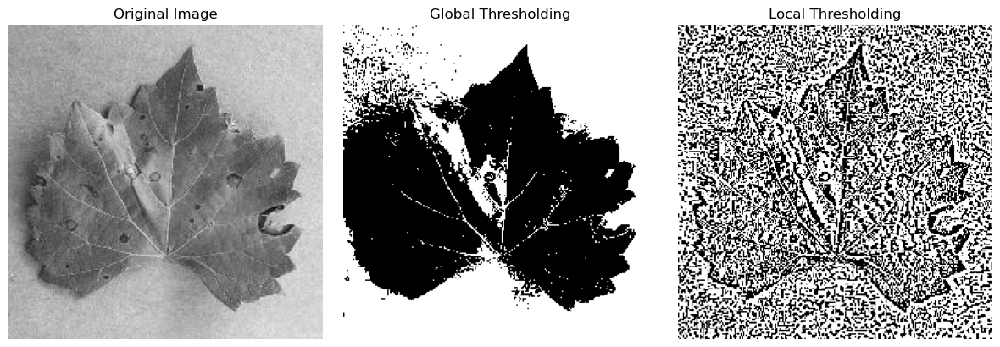

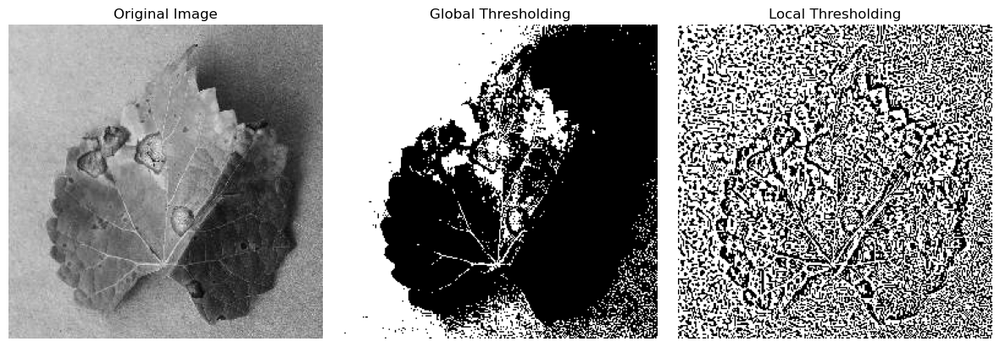

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


folder_path = "analysis_data"  

image_files = [f for f in os.listdir(folder_path) if f.endswith(('.png', '.JPG', '.jpeg'))]

# Define filtering criteria
min_width, max_width = 20, 1000
min_height, max_height = 20, 1000
min_area, max_area = 500, 5000

# Process each image in the folder
for image_file in image_files:
    # Load the image
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Global thresholding
    _, thresh_global = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

    # Local thresholding (adaptive)
    thresh_local = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                         cv2.THRESH_BINARY, 11, 2)

    
    # Plotting results
    plt.figure(figsize=(12, 8))

    # Original image
    plt.subplot(2, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    # Global thresholding
    plt.subplot(2, 3, 2)
    plt.imshow(thresh_global, cmap='gray')
    plt.title("Global Thresholding")
    plt.axis('off')

    # Local thresholding
    plt.subplot(2, 3, 3)
    plt.imshow(thresh_local, cmap='gray')
    plt.title("Local Thresholding")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


# Morphological Operations with Intrusion and Extrusion

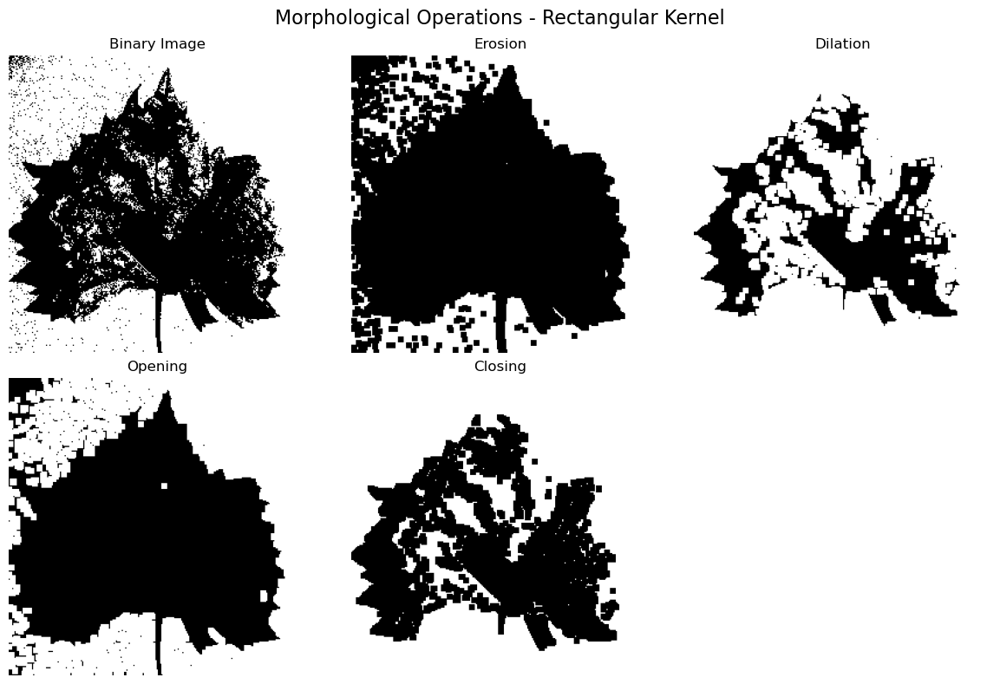

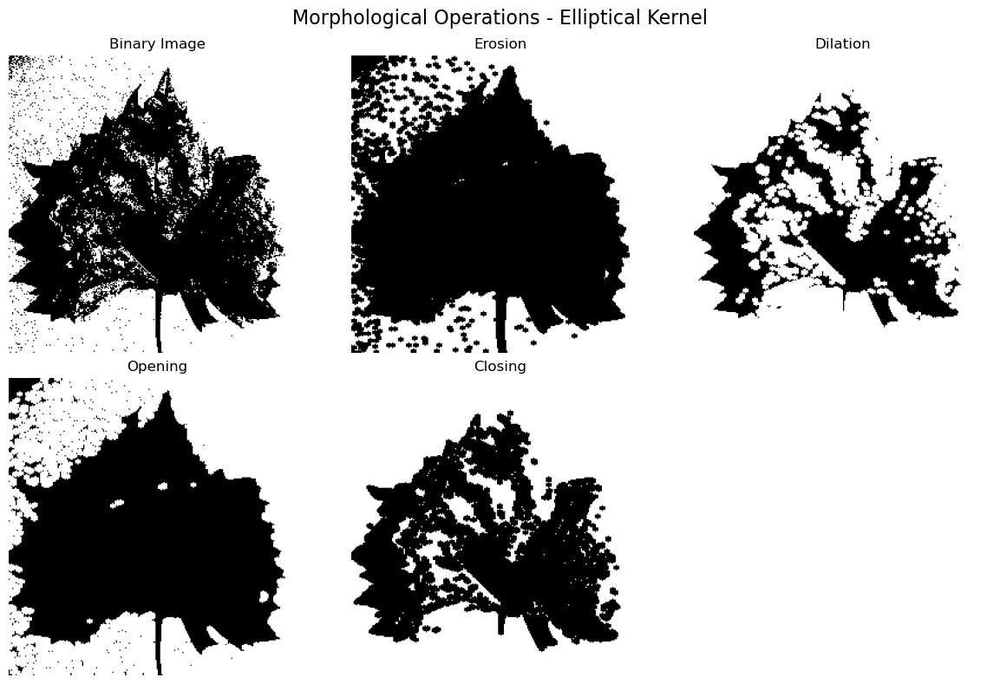

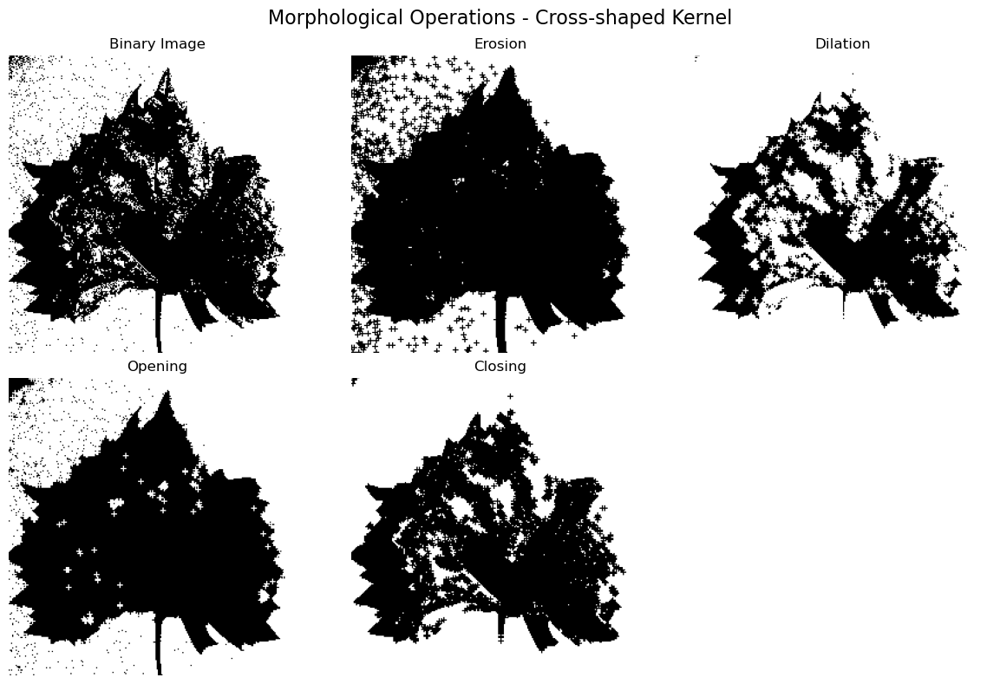

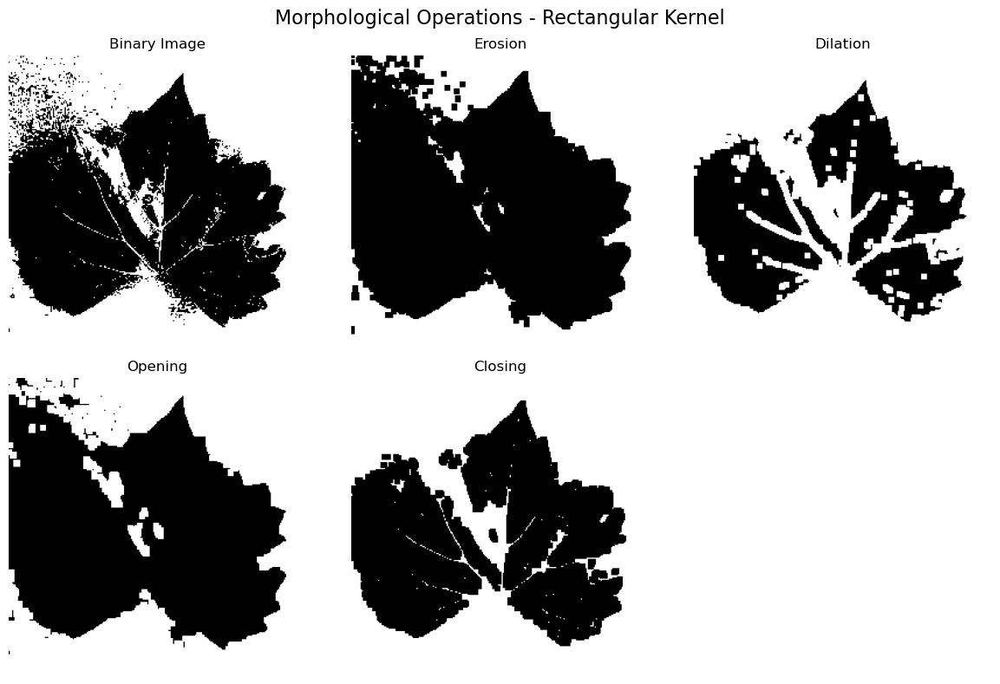

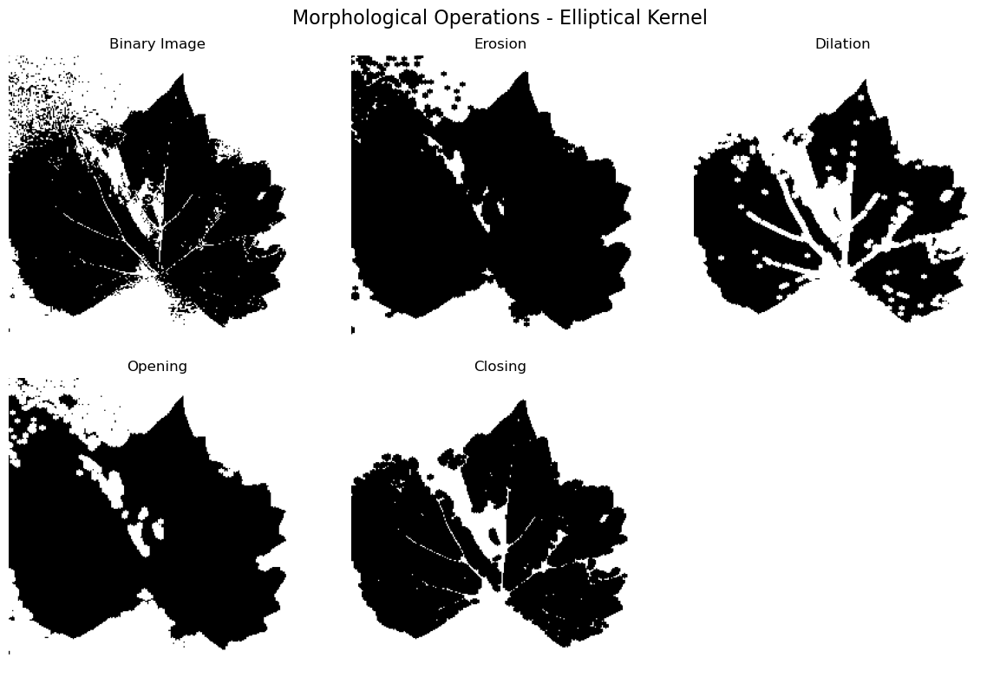

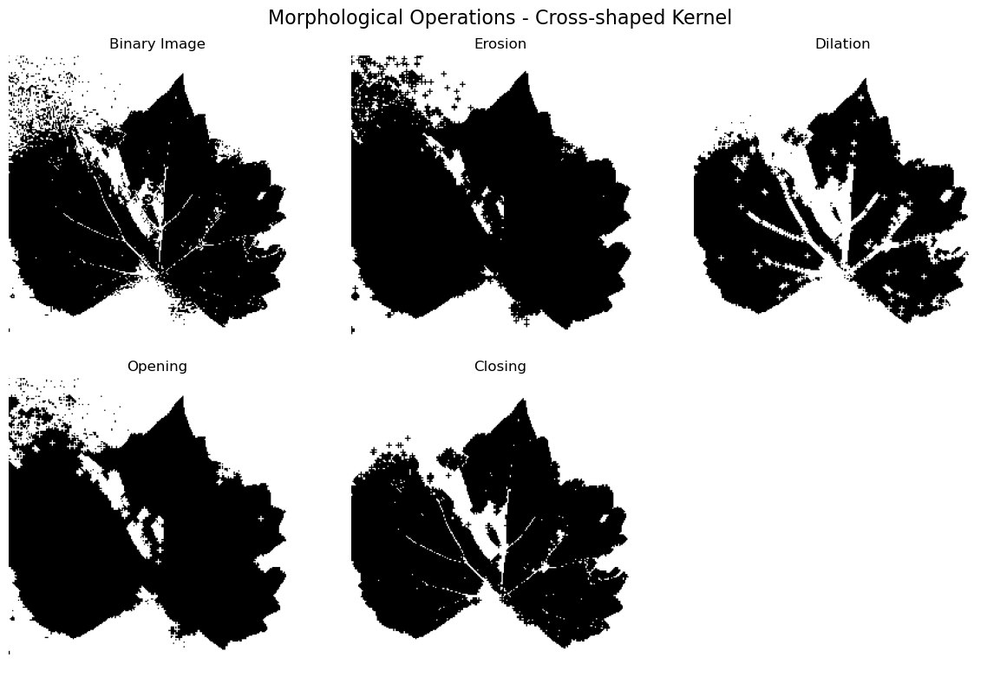

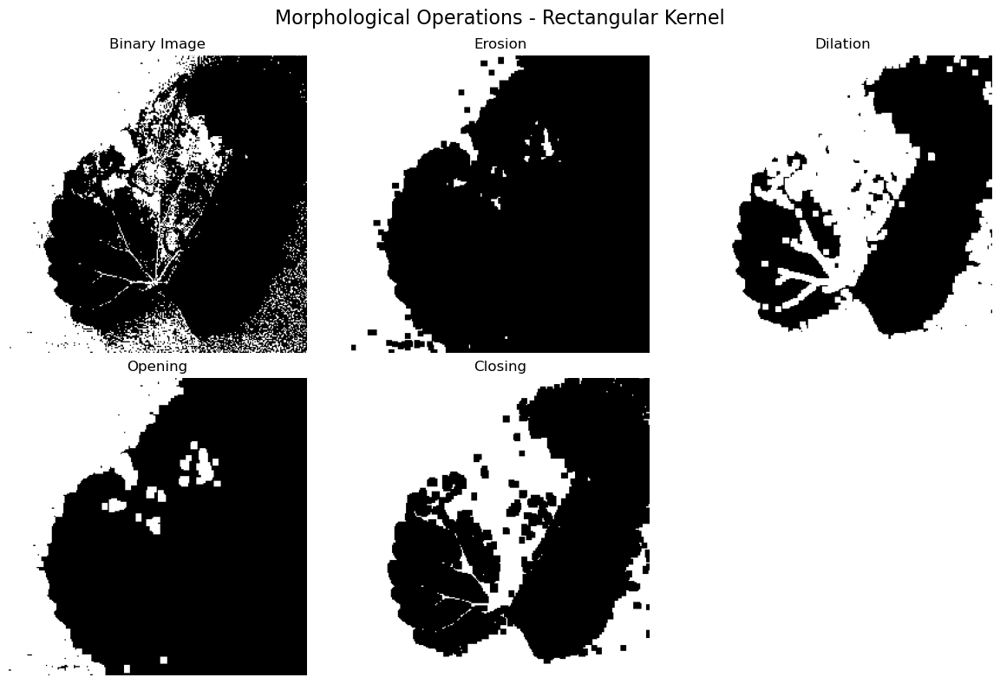

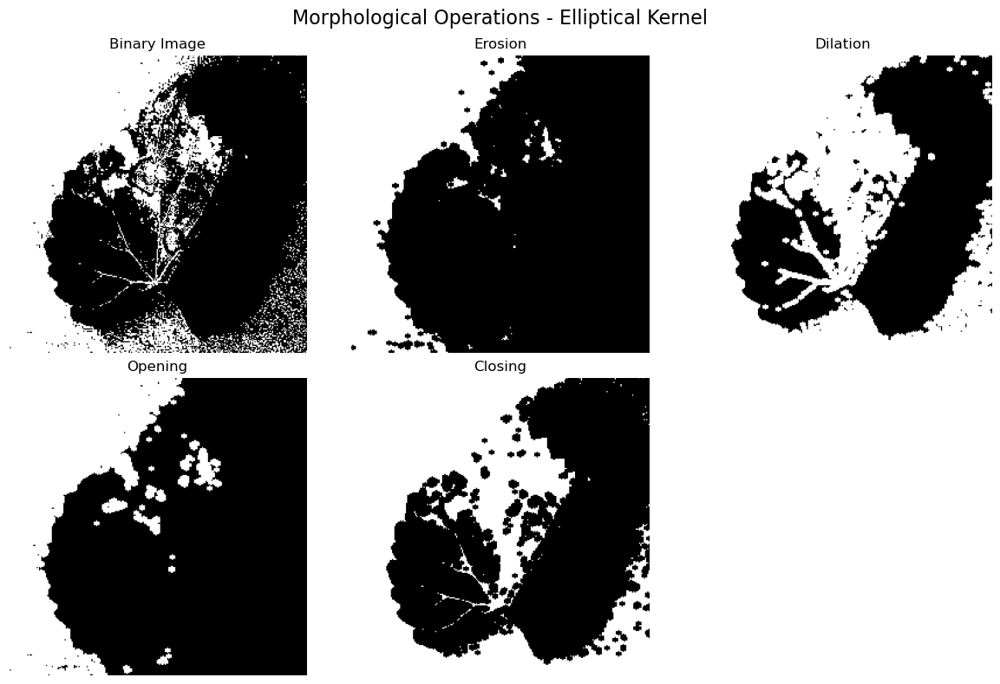

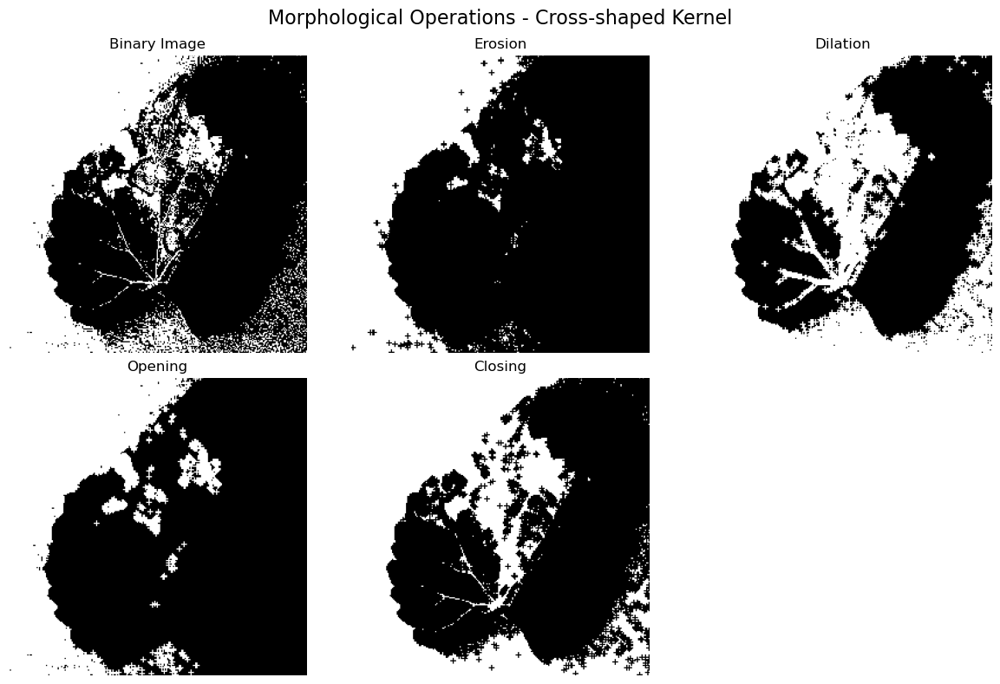

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


folder_path = "analysis_data"  


image_files = [f for f in os.listdir(folder_path) if f.endswith(('.png', '.JPG', '.jpeg'))]

# Define different structuring elements (kernels)
kernels = {
    "Rectangular": cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5)),
    "Elliptical": cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)),
    "Cross-shaped": cv2.getStructuringElement(cv2.MORPH_CROSS, (5, 5))
}

# Process each image in the folder
for image_file in image_files:
    # Load the image in grayscale
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply binary thresholding
    _, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

    # Perform morphological operations for each kernel
    for kernel_name, kernel in kernels.items():
        # Erosion
        eroded = cv2.erode(binary_image, kernel, iterations=1)

        # Dilation
        dilated = cv2.dilate(binary_image, kernel, iterations=1)

        # Opening (Erosion followed by Dilation)
        opened = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)

        # Closing (Dilation followed by Erosion)
        closed = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)

        # Plotting results
        plt.figure(figsize=(12, 8))
        plt.suptitle(f"Morphological Operations - {kernel_name} Kernel", fontsize=16)

        # Original image
        plt.subplot(2, 3, 1)
        plt.imshow(binary_image, cmap='gray')
        plt.title("Binary Image")
        plt.axis('off')

        # Erosion
        plt.subplot(2, 3, 2)
        plt.imshow(eroded, cmap='gray')
        plt.title("Erosion")
        plt.axis('off')

        # Dilation
        plt.subplot(2, 3, 3)
        plt.imshow(dilated, cmap='gray')
        plt.title("Dilation")
        plt.axis('off')

        # Opening
        plt.subplot(2, 3, 4)
        plt.imshow(opened, cmap='gray')
        plt.title("Opening")
        plt.axis('off')

        # Closing
        plt.subplot(2, 3, 5)
        plt.imshow(closed, cmap='gray')
        plt.title("Closing")
        plt.axis('off')

        plt.tight_layout()
        plt.show()


# Non-Linear Spatial Filtering Using Variants of Order Statistics Filter

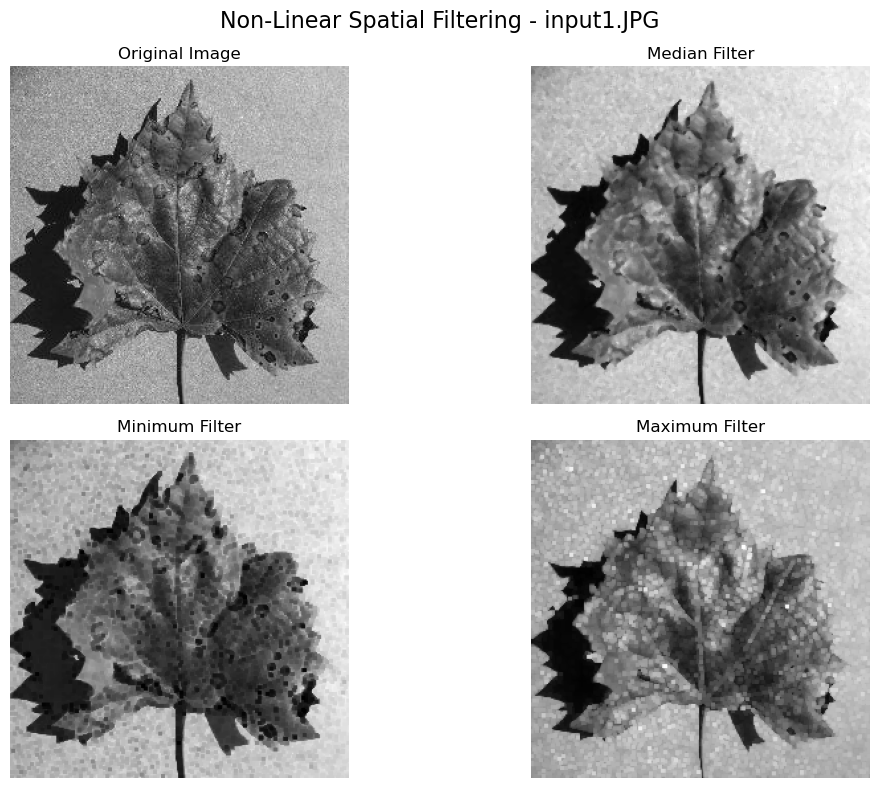

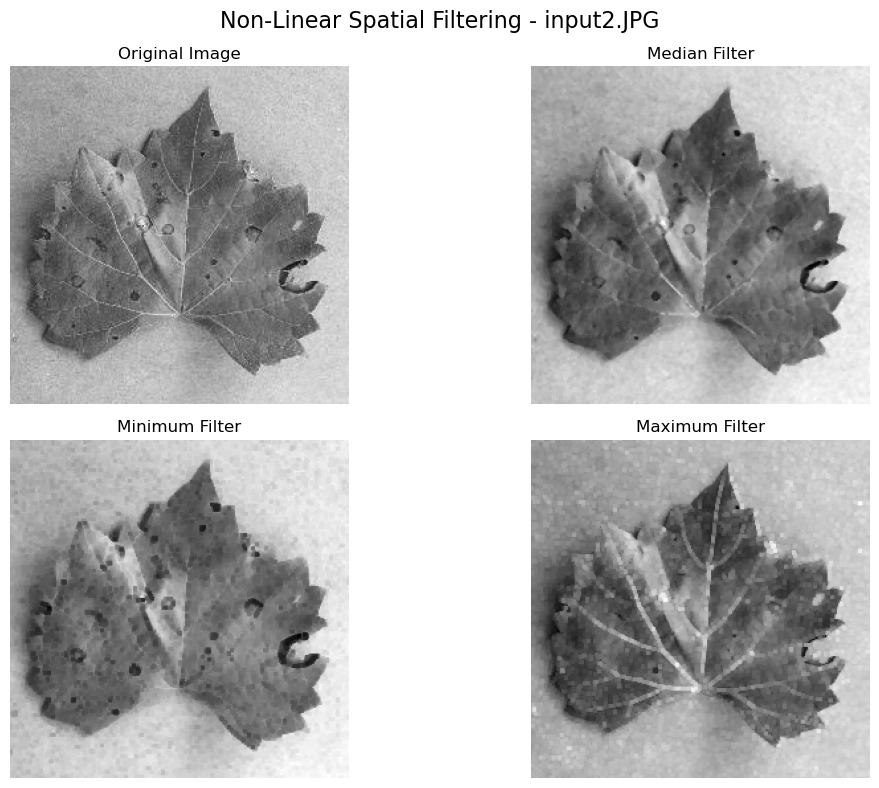

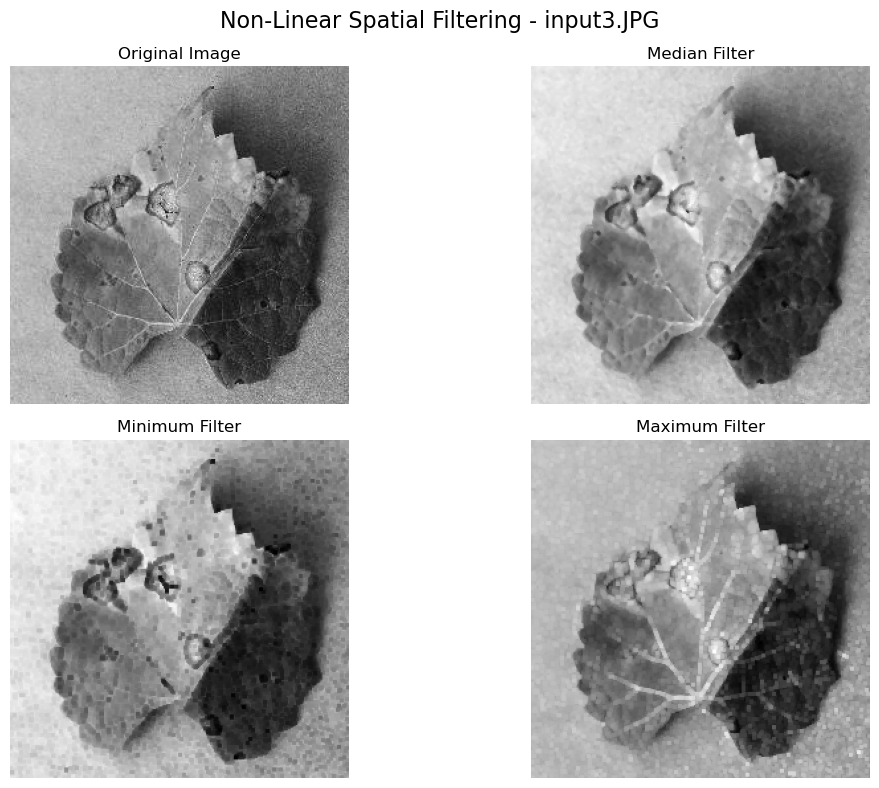

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.ndimage import median_filter, minimum_filter, maximum_filter

folder_path = "analysis_data"  


image_files = [f for f in os.listdir(folder_path) if f.endswith(('.png', '.JPG', '.jpeg'))]


for image_file in image_files:
    # Load the image in grayscale
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply different Order Statistics Filters
    # Median filter
    median_filtered = median_filter(image, size=3)

    # Minimum filter
    minimum_filtered = minimum_filter(image, size=3)

    # Maximum filter
    maximum_filtered = maximum_filter(image, size=3)

    # Plotting the results
    plt.figure(figsize=(12, 8))
    plt.suptitle(f"Non-Linear Spatial Filtering - {image_file}", fontsize=16)

    # Original image
    plt.subplot(2, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    # Median Filtered Image
    plt.subplot(2, 2, 2)
    plt.imshow(median_filtered, cmap='gray')
    plt.title("Median Filter")
    plt.axis('off')

    # Minimum Filtered Image
    plt.subplot(2, 2, 3)
    plt.imshow(minimum_filtered, cmap='gray')
    plt.title("Minimum Filter")
    plt.axis('off')

    # Maximum Filtered Image
    plt.subplot(2, 2, 4)
    plt.imshow(maximum_filtered, cmap='gray')
    plt.title("Maximum Filter")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


# Histogram Matching on Images

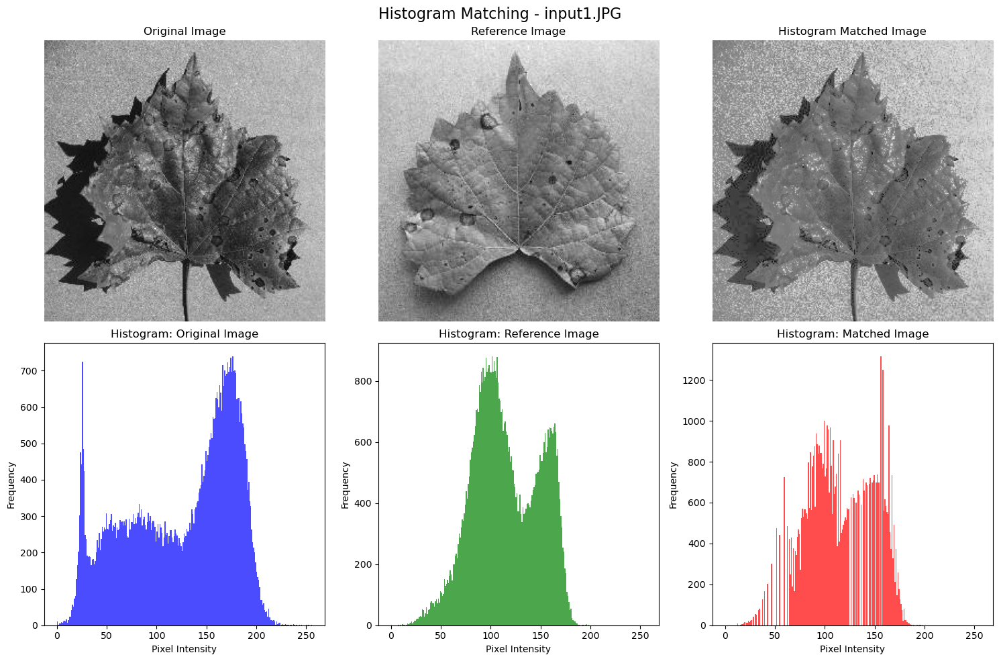

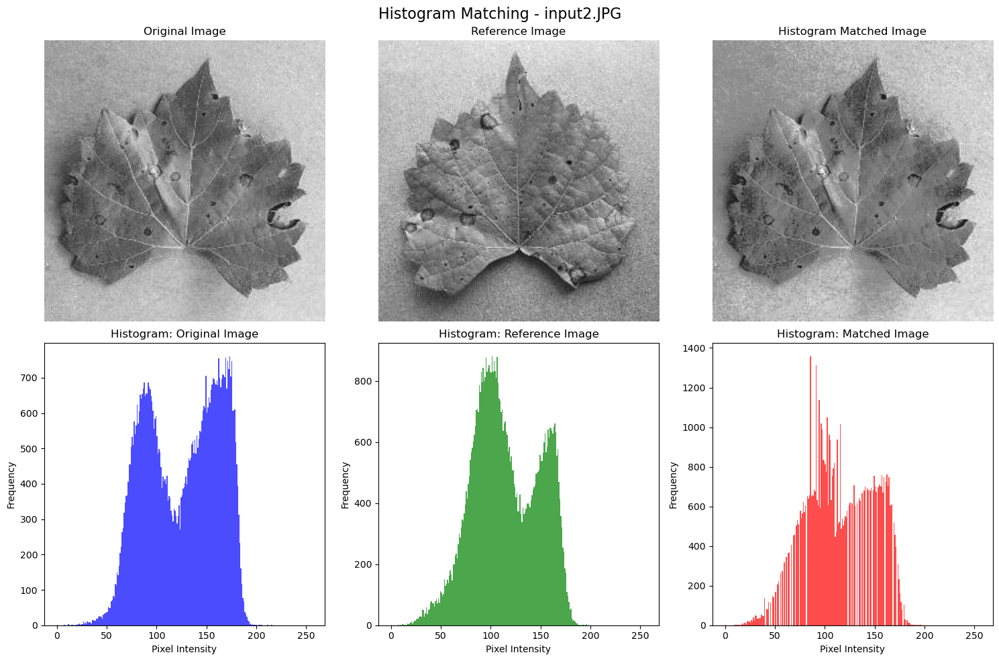

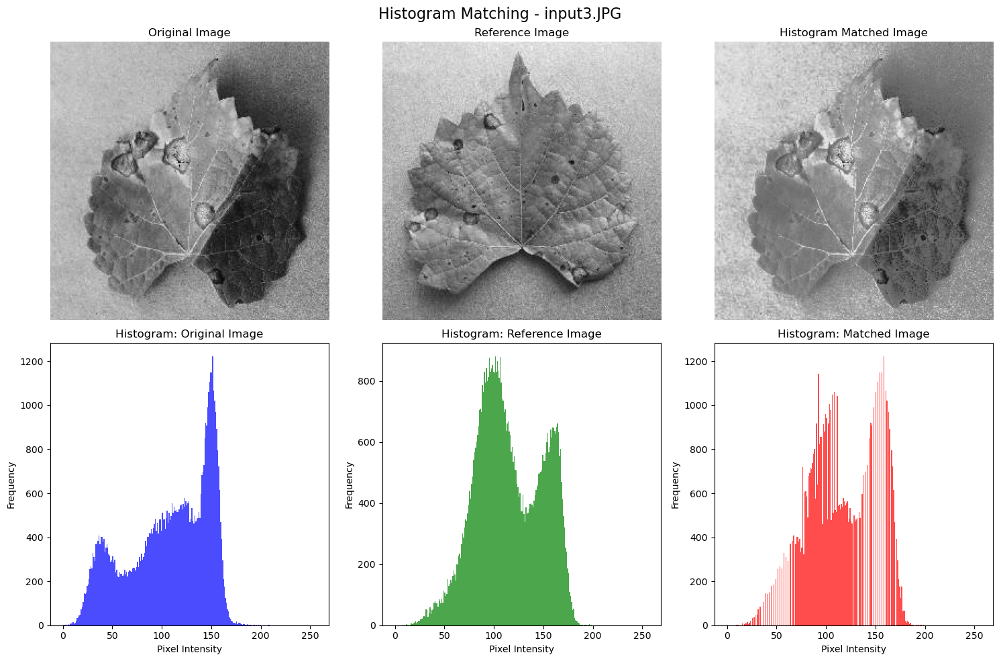

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from skimage.exposure import match_histograms


folder_path = "analysis_data"  


reference_image_path = "reference_img.JPG"  
reference_image = cv2.imread(reference_image_path, cv2.IMREAD_GRAYSCALE)


image_files = [f for f in os.listdir(folder_path) if f.endswith(('.png', '.JPG', '.jpeg'))]


for image_file in image_files:
    # Load the image in grayscale
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Perform histogram matching
    matched_image = match_histograms(image, reference_image, channel_axis=None)

    # Plot the results
    plt.figure(figsize=(15, 10))
    plt.suptitle(f"Histogram Matching - {image_file}", fontsize=16)

    # Original Image
    plt.subplot(2, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    # Reference Image
    plt.subplot(2, 3, 2)
    plt.imshow(reference_image, cmap='gray')
    plt.title("Reference Image")
    plt.axis('off')

    # Histogram Matched Image
    plt.subplot(2, 3, 3)
    plt.imshow(matched_image, cmap='gray')
    plt.title("Histogram Matched Image")
    plt.axis('off')

    # Histogram of Original Image
    plt.subplot(2, 3, 4)
    plt.hist(image.ravel(), bins=256, range=(0, 256), color='blue', alpha=0.7)
    plt.title("Histogram: Original Image")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    # Histogram of Reference Image
    plt.subplot(2, 3, 5)
    plt.hist(reference_image.ravel(), bins=256, range=(0, 256), color='green', alpha=0.7)
    plt.title("Histogram: Reference Image")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    # Histogram of Matched Image
    plt.subplot(2, 3, 6)
    plt.hist(matched_image.ravel(), bins=256, range=(0, 256), color='red', alpha=0.7)
    plt.title("Histogram: Matched Image")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()


# Compression techniques to all images in the folder

Image: input1.JPG
Original Image Size: 524288 bits
Huffman Encoding: Compressed Size = 491457 bits, Compression Ratio = 1.07
Run-Length Encoding: Compressed Size = 3858592 bits, Compression Ratio = 0.14
LZW Compression: Compressed Size = 80 bits, Compression Ratio = 6553.60
--------------------------------------------------


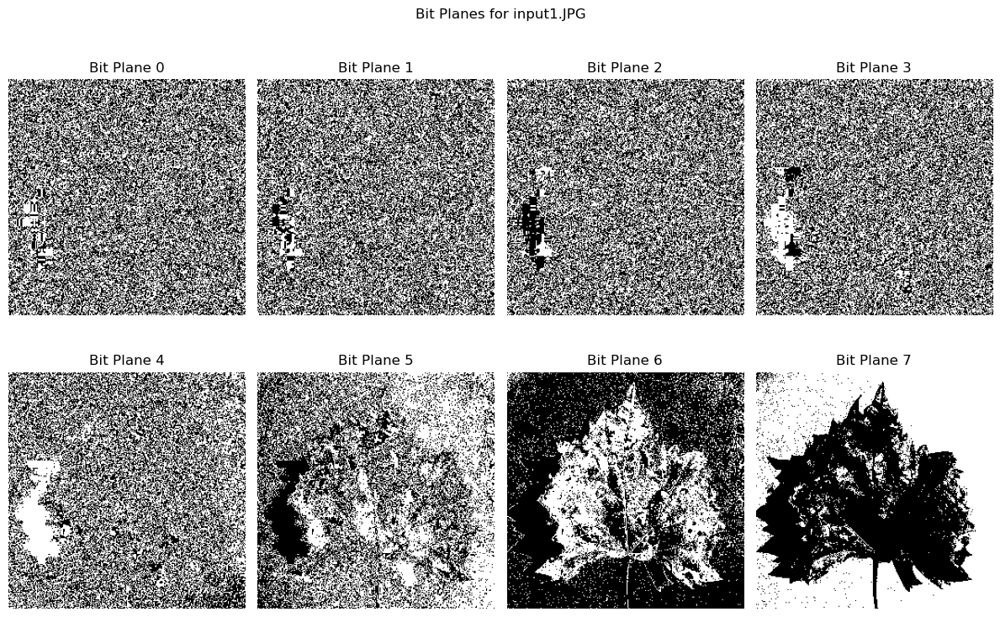

Image: input2.JPG
Original Image Size: 524288 bits
Huffman Encoding: Compressed Size = 462128 bits, Compression Ratio = 1.13
Run-Length Encoding: Compressed Size = 3791600 bits, Compression Ratio = 0.14
LZW Compression: Compressed Size = 80 bits, Compression Ratio = 6553.60
--------------------------------------------------


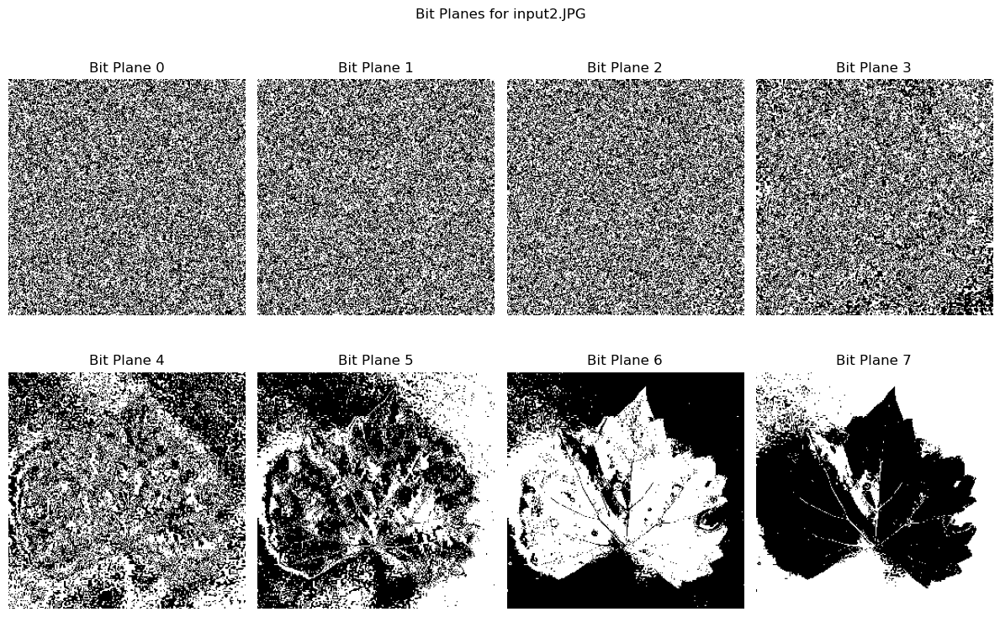

Image: input3.JPG
Original Image Size: 524288 bits
Huffman Encoding: Compressed Size = 465439 bits, Compression Ratio = 1.13
Run-Length Encoding: Compressed Size = 3757056 bits, Compression Ratio = 0.14
LZW Compression: Compressed Size = 80 bits, Compression Ratio = 6553.60
--------------------------------------------------


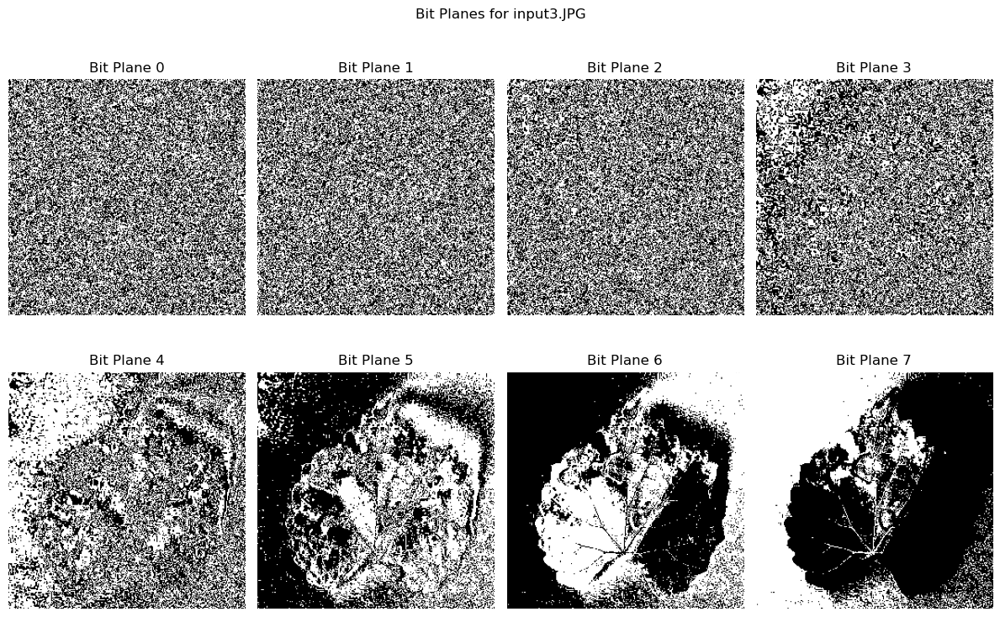

In [8]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import heapq
from collections import defaultdict

# Helper function: Huffman Coding
class HuffmanCoding:
    def __init__(self, data):
        self.data = data
        self.heap = []
        self.codes = {}
        self.reverse_mapping = {}

    class HeapNode:
        def __init__(self, char, freq):
            self.char = char
            self.freq = freq
            self.left = None
            self.right = None

        def __lt__(self, other):
            return self.freq < other.freq

    def make_frequency_dict(self):
        frequency = defaultdict(int)
        for char in self.data:
            frequency[char] += 1
        return frequency

    def build_heap(self, frequency):
        for char, freq in frequency.items():
            node = self.HeapNode(char, freq)
            heapq.heappush(self.heap, node)

    def merge_nodes(self):
        while len(self.heap) > 1:
            node1 = heapq.heappop(self.heap)
            node2 = heapq.heappop(self.heap)
            merged = self.HeapNode(None, node1.freq + node2.freq)
            merged.left = node1
            merged.right = node2
            heapq.heappush(self.heap, merged)

    def make_codes_helper(self, root, current_code):
        if root is None:
            return
        if root.char is not None:
            self.codes[root.char] = current_code
            self.reverse_mapping[current_code] = root.char
            return
        self.make_codes_helper(root.left, current_code + "0")
        self.make_codes_helper(root.right, current_code + "1")

    def make_codes(self):
        root = heapq.heappop(self.heap)
        current_code = ""
        self.make_codes_helper(root, current_code)

    def encode(self):
        encoded_data = ""
        for char in self.data:
            encoded_data += self.codes[char]
        return encoded_data

    def compress(self):
        frequency = self.make_frequency_dict()
        self.build_heap(frequency)
        self.merge_nodes()
        self.make_codes()
        encoded_data = self.encode()
        return encoded_data, len(encoded_data)

# Helper function: Run-Length Encoding
def run_length_encoding(data):
    compressed = []
    count = 1
    for i in range(1, len(data)):
        if data[i] == data[i - 1]:
            count += 1
        else:
            compressed.append((data[i - 1], count))
            count = 1
    compressed.append((data[-1], count))
    return compressed

# Helper function: Bit Plane Slicing
def bit_plane_slicing(image):
    planes = []
    for i in range(8):
        plane = np.bitwise_and(image, 1 << i)
        planes.append(plane)
    return planes

# Helper function: Calculate Compression Ratio
def compression_ratio(original_size, compressed_size):
    return original_size / compressed_size


folder_path = "analysis_data"  


for filename in os.listdir(folder_path):
    if filename.endswith((".JPG", ".png", ".jpeg")):
        image_path = os.path.join(folder_path, filename)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # Convert image to 1D array for compression
        flattened_image = image.flatten()

        # Huffman Coding
        huffman = HuffmanCoding(flattened_image)
        huffman_encoded, huffman_size = huffman.compress()
        original_size = flattened_image.nbytes * 8  # in bits
        huffman_ratio = compression_ratio(original_size, huffman_size)

        # Run-Length Encoding
        rle_encoded = run_length_encoding(flattened_image)
        rle_size = sum(len(str(pair)) * 8 for pair in rle_encoded)  # approximate in bits
        rle_ratio = compression_ratio(original_size, rle_size)

        # Bit Plane Slicing
        bit_planes = bit_plane_slicing(image)

        # LZW Compression (approximation using string)
        lzw_encoded = "".join(map(str, flattened_image))
        lzw_size = len(set(lzw_encoded)) * 8  # approximate in bits
        lzw_ratio = compression_ratio(original_size, lzw_size)

        # Display Results for Each Image
        print(f"Image: {filename}")
        print(f"Original Image Size: {original_size} bits")
        print(f"Huffman Encoding: Compressed Size = {huffman_size} bits, Compression Ratio = {huffman_ratio:.2f}")
        print(f"Run-Length Encoding: Compressed Size = {rle_size} bits, Compression Ratio = {rle_ratio:.2f}")
        print(f"LZW Compression: Compressed Size = {lzw_size} bits, Compression Ratio = {lzw_ratio:.2f}")
        print("-" * 50)

        # Visualize Bit Planes
        plt.figure(figsize=(12, 8))
        for i, plane in enumerate(bit_planes):
            plt.subplot(2, 4, i + 1)
            plt.imshow(plane, cmap="gray")
            plt.title(f"Bit Plane {i}")
            plt.axis("off")
        plt.suptitle(f"Bit Planes for {filename}")
        plt.tight_layout()
        plt.show()


### Edge Detection 

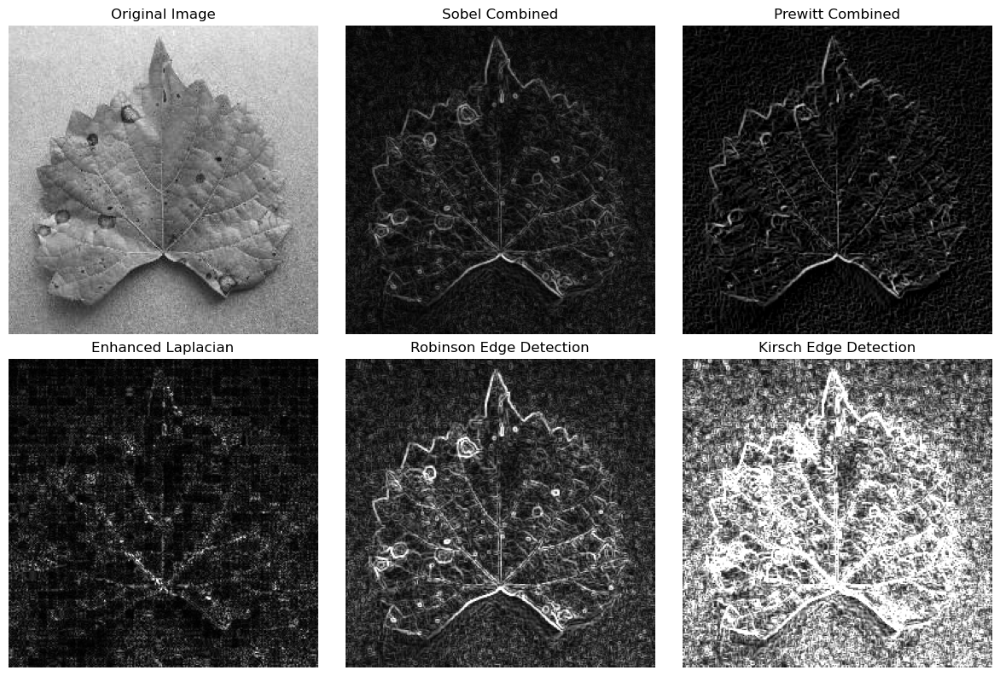

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_path = "reference_img.JPG"
wolf_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)


sobel_x = cv2.Sobel(wolf_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(wolf_image, cv2.CV_64F, 0, 1, ksize=3)
sobel_combined = cv2.magnitude(sobel_x, sobel_y)


prewitt_x = cv2.filter2D(wolf_image, -1, np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]]))
prewitt_y = cv2.filter2D(wolf_image, -1, np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]))
prewitt_combined = cv2.magnitude(prewitt_x.astype(float), prewitt_y.astype(float))


laplacian = cv2.Laplacian(wolf_image, cv2.CV_64F)
laplacian_enhanced = cv2.convertScaleAbs(laplacian)


robinson_masks = [
    np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]]),  # East
    np.array([[0, -1, -2], [1, 0, -1], [2, 1, 0]]),  # Southeast
    np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]]),  # South
    np.array([[-2, -1, 0], [-1, 0, 1], [0, 1, 2]]),  # Southwest
    np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]),  # West
    np.array([[0, 1, 2], [-1, 0, 1], [-2, -1, 0]]),  # Northwest
    np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]]),  # North
    np.array([[2, 1, 0], [1, 0, -1], [0, -1, -2]]),  # Northeast
]


kirsch_masks = [
    np.array([[5, 5, 5], [-3, 0, -3], [-3, -3, -3]]),  # North
    np.array([[-3, 5, 5], [-3, 0, 5], [-3, -3, -3]]),  # Northeast
    np.array([[-3, -3, 5], [-3, 0, 5], [-3, -3, 5]]),  # East
    np.array([[-3, -3, -3], [-3, 0, 5], [-3, 5, 5]]),  # Southeast
    np.array([[-3, -3, -3], [-3, 0, -3], [5, 5, 5]]),  # South
    np.array([[-3, -3, -3], [5, 0, -3], [5, 5, -3]]),  # Southwest
    np.array([[5, -3, -3], [5, 0, -3], [5, -3, -3]]),  # West
    np.array([[5, 5, -3], [5, 0, -3], [-3, -3, -3]]),  # Northwest
]


def apply_compass_masks(image, masks):
    edges = [cv2.filter2D(image, -1, mask) for mask in masks]
    return np.max(edges, axis=0)  # Combine the maximum response from all directions

robinson_edges = apply_compass_masks(wolf_image, robinson_masks)
kirsch_edges = apply_compass_masks(wolf_image, kirsch_masks)

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.ravel()
titles = [
    "Original Image", "Sobel Combined", "Prewitt Combined",
    "Enhanced Laplacian", "Robinson Edge Detection", "Kirsch Edge Detection"
]
images = [wolf_image, sobel_combined, prewitt_combined, laplacian_enhanced, robinson_edges, kirsch_edges]

for ax, title, img in zip(axes, titles, images):
    ax.imshow(img, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()
